# A walk through latent space with Stable Diffusion
- M4 pro 의 GPU 이용
- VSCode 사용

### Macbook M4 pro 에서 conda env 환경 설정

```bash
# 새 환경 생성
conda create -n stable-diffusion python=3.10 -y
conda activate stable-diffusion

# 필요한 패키지들 순서대로 설치
pip install tensorflow-macos==2.15.0
pip install tensorflow-metal==1.1.0
pip install keras==2.15.0
pip install keras-core==0.1.7
pip install keras-cv==0.6.0
pip install matplotlib numpy pillow ipykernel jupyter

python -m ipykernel install --user --name stable-diffusion --display-name "Python (Stable Diffusion)"
```

### GPU 사용 확인 및 StableDiffusion 사용 가능 확인 코드

Using TensorFlow backend
TensorFlow version: 2.15.0
GPU devices: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]
By using this model checkpoint, you acknowledge that its usage is subject to the terms of the CreativeML Open RAIL-M license at https://raw.githubusercontent.com/CompVis/stable-diffusion/main/LICENSE

Model initialized successfully
10/10 [==============================] - 21s 146ms/step


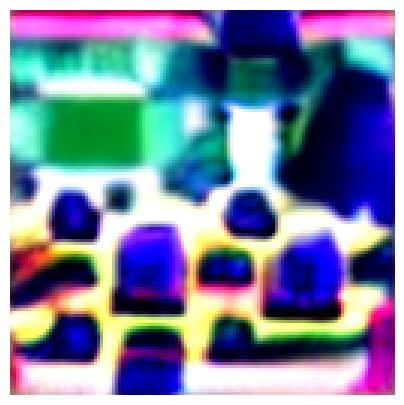

In [2]:
import os
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'

import tensorflow as tf
import keras_cv
import matplotlib.pyplot as plt
import numpy as np

# GPU 확인
print("TensorFlow version:", tf.__version__)
physical_devices = tf.config.list_physical_devices('GPU')
print("GPU devices:", physical_devices)

# Stable Diffusion 초기화
try:
    model = keras_cv.models.StableDiffusion(
        img_width=128,
        img_height=128,
        jit_compile=False
    )
    print("\nModel initialized successfully")

    # 간단한 테스트 이미지 생성
    prompt = "A simple landscape"
    images = model.text_to_image(
        prompt,
        batch_size=1,
        num_steps=10,
        seed=12345
    )

    plt.figure(figsize=(5, 5))
    plt.imshow(images[0])
    plt.axis('off')
    plt.show()

except Exception as e:
    print(f"\nError occurred: {str(e)}")
    import traceback
    traceback.print_exc()

By using this model checkpoint, you acknowledge that its usage is subject to the terms of the CreativeML Open RAIL-M license at https://raw.githubusercontent.com/CompVis/stable-diffusion/main/LICENSE
Model initialized successfully
31/31 [==============================] - 43s 657ms/step


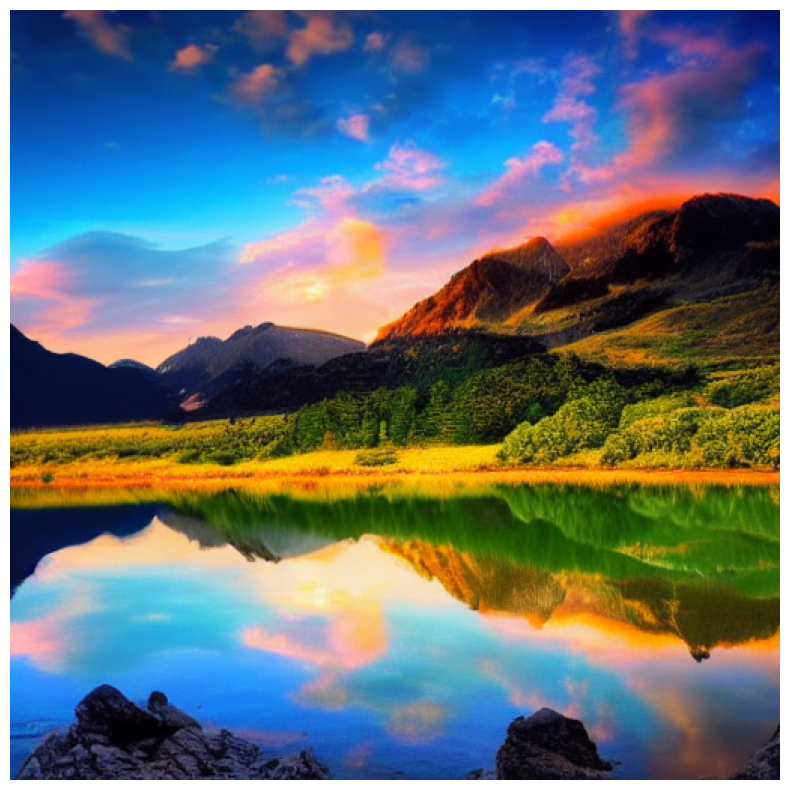

In [3]:
# 더 높은 품질의 이미지 생성 시도
try:
    model = keras_cv.models.StableDiffusion(
        img_width=512,  # 크기를 512x512로 증가
        img_height=512,
        jit_compile=False
    )
    print("Model initialized successfully")

    # 더 자세한 프롬프트와 더 많은 스텝으로 시도
    prompt = "A beautiful landscape with mountains and a lake at sunset, high quality, detailed"
    images = model.text_to_image(
        prompt,
        batch_size=1,
        num_steps=30,  # 스텝 수 증가
        seed=12345
    )

    plt.figure(figsize=(10, 10))
    plt.imshow(images[0])
    plt.axis('off')
    plt.show()

except Exception as e:
    print(f"\nError occurred: {str(e)}")
    import traceback
    traceback.print_exc()

31/31 [==============================] - 21s 667ms/step


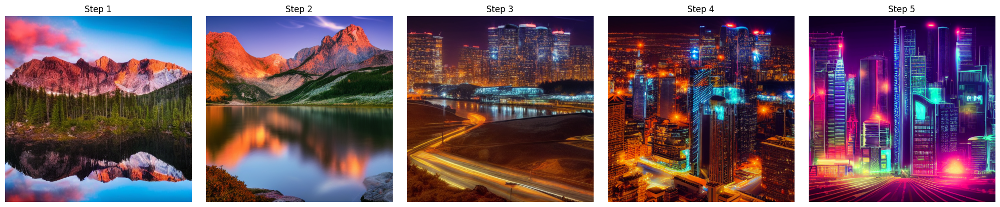

In [4]:
try:
    # 두 개의 서로 다른 프롬프트 설정
    prompt_1 = "A beautiful mountain landscape at sunset with a lake reflection"
    prompt_2 = "A futuristic cityscape at night with neon lights"

    # 각 프롬프트의 text embeddings 생성
    encoding_1 = tf.squeeze(model.encode_text(prompt_1))
    encoding_2 = tf.squeeze(model.encode_text(prompt_2))

    # interpolation steps 설정
    steps = 5
    interpolated_encodings = tf.linspace(encoding_1, encoding_2, steps)

    # 각 interpolated encoding에 대해 이미지 생성
    images = []
    for encoding in interpolated_encodings:
        image = model.generate_image(
            encoding,
            batch_size=1,
            num_steps=30
        )
        images.append(image[0])

    # 결과 시각화
    plt.figure(figsize=(20, 4))
    for i, img in enumerate(images):
        plt.subplot(1, steps, i+1)
        plt.imshow(img)
        plt.axis('off')
        plt.title(f'Step {i+1}')
    plt.tight_layout()
    plt.show()

except Exception as e:
    print(f"\nError occurred: {str(e)}")
    import traceback
    traceback.print_exc()

Step 1: 자연 그대로의 산악 풍경 - 일출에 물든 산봉우리와 소나무 숲, 호수에 비친 완벽한 반영  
Step 2: 여전히 자연 풍경이지만 구조가 조금 더 정돈된 느낌 - 호수와 산의 구도가 더 도시적인 느낌으로 변화  
Step 3: 자연과 도시의 전환점 - 도시의 스카이라인이 등장하기 시작하고 자연의 요소가 줄어듦  
Step 4: 도시적 요소가 강해지며 네온 불빛이 더해진 야경  
Step 5: 완전한 사이버펑크 스타일의 미래도시 - 네온 색상과 미래적인 건물들이 지배적  

물의 반영이 자연 호수에서 도시의 불빛 반영으로 자연스럽게 전환  
색상이 자연의 따뜻한 톤에서 도시의 네온 컬러로 점진적 변화  
산의 실루엣이 고층 빌딩의 실루엣으로 매끄럽게 전환  


31/31 [==============================] - 22s 706ms/step


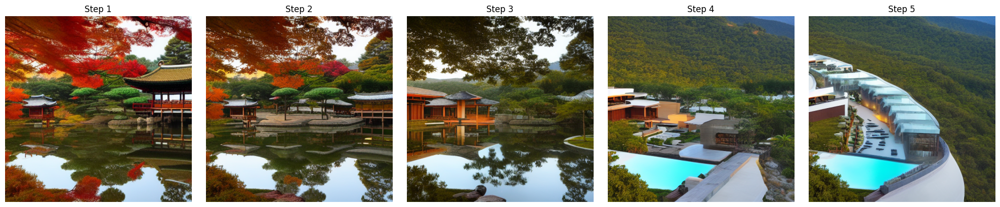

In [5]:
try:
    prompt_1 = "A traditional Korean garden with hanok architecture, stone lanterns, lotus pond, pine trees, and beautiful wooden pavilion in autumn colors, peaceful atmosphere, highly detailed"
    prompt_2 = "A modern luxury resort hotel with infinity pool, contemporary architecture, glass walls, minimalist design, scenic mountain view, evening mood lighting, high-end amenities"

    # 텍스트 임베딩 생성
    encoding_1 = tf.squeeze(model.encode_text(prompt_1))
    encoding_2 = tf.squeeze(model.encode_text(prompt_2))

    # interpolation steps
    steps = 5
    interpolated_encodings = tf.linspace(encoding_1, encoding_2, steps)

    # 각 interpolated encoding에 대해 이미지 생성
    images = []
    for encoding in interpolated_encodings:
        image = model.generate_image(
            encoding,
            batch_size=1,
            num_steps=30
        )
        images.append(image[0])

    # 결과 시각화
    plt.figure(figsize=(20, 4))
    for i, img in enumerate(images):
        plt.subplot(1, steps, i+1)
        plt.imshow(img)
        plt.axis('off')
        plt.title(f'Step {i+1}')
    plt.tight_layout()
    plt.show()

except Exception as e:
    print(f"\nError occurred: {str(e)}")
    import traceback
    traceback.print_exc()

Step 1: 단풍나무와 연못이 있는 전통 한국 정원의 전형적인 모습이 잘 표현됨  
Step 2: 여전히 전통적이지만 구조물이 조금 더 현대적인 느낌으로 변화하기 시작  
Step 3: 전통 건축물의 형태를 유지하면서도 현대적 요소가 혼합되기 시작  
Step 4: 현대적 리조트의 특징이 더욱 두드러지며 인피니티 풀이 등장  
Step 5: 완전한 현대식 리조트의 모습으로, 곡선형 디자인과 인피니티 풀이 산과 조화를 이룸  

특히 물(연못에서 인피니티 풀로)과 자연(단풍나무에서 산으로)이 각 단계에서 연결 요소로 작용하면서 자연스러운 전환이 되었음

31/31 [==============================] - 21s 688ms/step


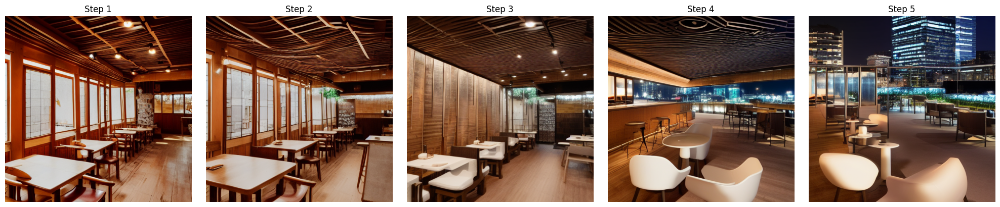

In [6]:
try:
    prompt_1 = "A cozy Korean traditional hanok cafe with wooden beam ceiling, hanji paper doors, warm lighting, tea cups on low wooden tables, autumn maple trees visible through windows, vintage mood"

    prompt_2 = "A sleek modern rooftop bar at night with city skyline views, minimalist furniture, LED mood lighting, glass walls, outdoor lounge area with contemporary Korean design elements, high-end cocktail bar"

    # 텍스트 임베딩 생성
    encoding_1 = tf.squeeze(model.encode_text(prompt_1))
    encoding_2 = tf.squeeze(model.encode_text(prompt_2))

    # interpolation steps
    steps = 5
    interpolated_encodings = tf.linspace(encoding_1, encoding_2, steps)

    # 각 interpolated encoding에 대해 이미지 생성
    images = []
    for encoding in interpolated_encodings:
        image = model.generate_image(
            encoding,
            batch_size=1,
            num_steps=30
        )
        images.append(image[0])

    # 결과 시각화
    plt.figure(figsize=(20, 4))
    for i, img in enumerate(images):
        plt.subplot(1, steps, i+1)
        plt.imshow(img)
        plt.axis('off')
        plt.title(f'Step {i+1}')
    plt.tight_layout()
    plt.show()

except Exception as e:
    print(f"\nError occurred: {str(e)}")
    import traceback
    traceback.print_exc()

Step 1: 전통적인 한옥 카페의 모습이 잘 표현됨 - 한지문, 목재 천장, 전통적인 테이블 배치  
Step 2: 약간의 현대적 요소가 들어오기 시작하면서도 한옥의 따뜻한 분위기 유지  
Step 3: 벽면 디자인이 현대적으로 변화하고 좌석 배치가 세련되게 변화  
Step 4: 야간 조명과 현대적인 가구가 등장하며 루프탑 분위기로 전환  
Step 5: 완전한 현대식 루프탑 바의 모습 - 도시 전망, 모던한 가구, 세련된 조명  

나무 천장의 요소가 각 단계를 거치며 자연스럽게 현대적 디자인으로 변화  
테이블과 의자가 전통적 스타일에서 모던한 디자인으로 점진적 변화  
조명의 변화가 공간의 분위기 전환을 잘 표현  


31/31 [==============================] - 22s 704ms/step


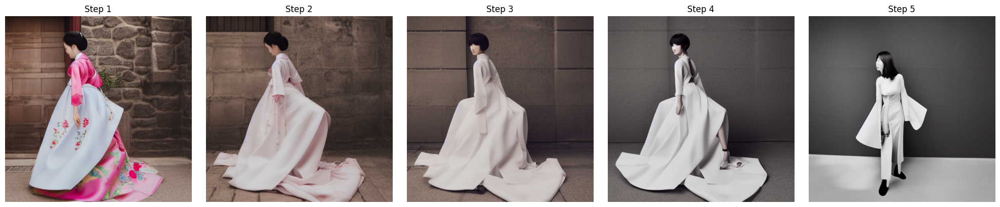

In [7]:
try:
    prompt_1 = "Traditional Korean hanbok fashion photography, elegant woman wearing colorful silk hanbok with embroidered details, long flowing skirt, delicate hair ornaments, standing in a traditional courtyard, soft natural lighting, high fashion photography style"

    prompt_2 = "Modern Korean fashion photography, stylish woman wearing contemporary designer outfit with Korean-inspired elements, minimalist silhouette, urban setting at night, dramatic studio lighting, high-end fashion magazine style"

    # 텍스트 임베딩 생성
    encoding_1 = tf.squeeze(model.encode_text(prompt_1))
    encoding_2 = tf.squeeze(model.encode_text(prompt_2))

    # interpolation steps
    steps = 5
    interpolated_encodings = tf.linspace(encoding_1, encoding_2, steps)

    # 각 interpolated encoding에 대해 이미지 생성
    images = []
    for encoding in interpolated_encodings:
        image = model.generate_image(
            encoding,
            batch_size=1,
            num_steps=30
        )
        images.append(image[0])

    # 결과 시각화
    plt.figure(figsize=(20, 4))
    for i, img in enumerate(images):
        plt.subplot(1, steps, i+1)
        plt.imshow(img)
        plt.axis('off')
        plt.title(f'Step {i+1}')
    plt.tight_layout()
    plt.show()

except Exception as e:
    print(f"\nError occurred: {str(e)}")
    import traceback
    traceback.print_exc()

Step 1: 전통적인 한복의 모습 - 분홍색 저고리와 꽃 자수가 놓인 흰색 치마의 전형적인 한복  
Step 2: 색상이 연해지면서 전통과 현대의 중간으로 전환 시작 - 실루엣은 한복이지만 더 미니멀해짐  
Step 3: 현대적 해석이 더해진 한복 디자인 - 구조적인 실루엣으로 변화  
Step 4: 한복의 선을 유지하면서도 현대적 쿠튀르 느낌으로 발전  
Step 5: 완전한 현대 패션 - 한복의 소매 라인만 남은 미니멀한 화이트 드레스로 변환  

한복의 곡선미가 단계별로 구조적인 형태로 변화  
화려한 색상에서 미니멀한 화이트 톤으로의 자연스러운 전환  
배경도 전통적인 돌담에서 현대적인 스튜디오로 변화  
의상의 볼륨감이 유지되면서도 점차 현대적으로 재해석  


31/31 [==============================] - 22s 717ms/step


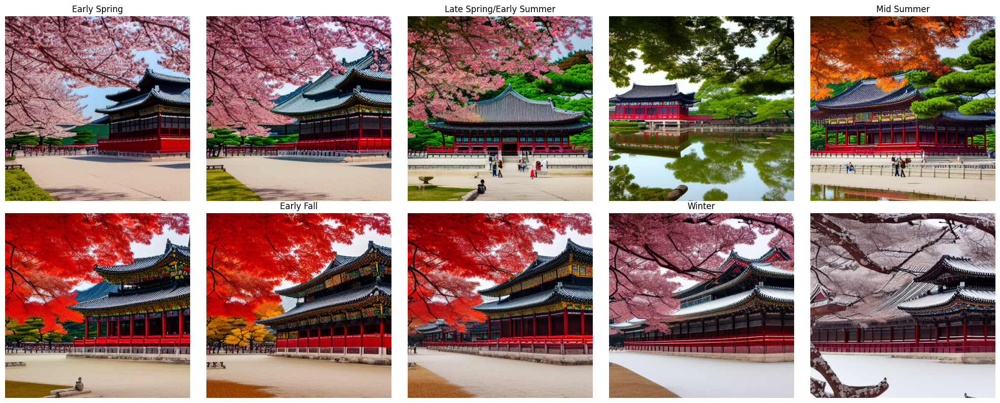

In [8]:
try:
    prompt_1 = "Gyeongbokgung Palace in spring, cherry blossoms in full bloom, clear blue sky, traditional Korean palace architecture, beautiful spring atmosphere, masterful photography"

    prompt_2 = "Gyeongbokgung Palace in summer, lush green trees, lotus pond, vibrant colors, traditional Korean architecture, clear summer day"

    prompt_3 = "Gyeongbokgung Palace in autumn, red and golden maple trees, crisp fall colors, traditional Korean palace buildings, perfect fall weather"

    prompt_4 = "Gyeongbokgung Palace in winter, snow covered roofs and grounds, bare trees with snow, serene winter atmosphere, traditional Korean architecture"

    # 각 계절의 텍스트 임베딩 생성
    encoding_spring = tf.squeeze(model.encode_text(prompt_1))
    encoding_summer = tf.squeeze(model.encode_text(prompt_2))
    encoding_fall = tf.squeeze(model.encode_text(prompt_3))
    encoding_winter = tf.squeeze(model.encode_text(prompt_4))

    # 각 계절 사이의 interpolation steps
    steps = 4

    # 봄->여름->가을->겨울로 이어지는 interpolation
    spring_to_summer = tf.linspace(encoding_spring, encoding_summer, steps)
    summer_to_fall = tf.linspace(encoding_summer, encoding_fall, steps)
    fall_to_winter = tf.linspace(encoding_fall, encoding_winter, steps)

    # 전체 시퀀스 생성
    all_encodings = tf.concat([spring_to_summer, summer_to_fall[1:], fall_to_winter[1:]], axis=0)

    # 이미지 생성
    images = []
    for encoding in all_encodings:
        image = model.generate_image(
            encoding,
            batch_size=1,
            num_steps=30
        )
        images.append(image[0])

    # 결과 시각화
    plt.figure(figsize=(20, 8))
    for i, img in enumerate(images):
        plt.subplot(2, 5, i+1)
        plt.imshow(img)
        plt.axis('off')
        if i == 0:
            plt.title('Early Spring')
        elif i == 2:
            plt.title('Late Spring/Early Summer')
        elif i == 4:
            plt.title('Mid Summer')
        elif i == 6:
            plt.title('Early Fall')
        elif i == 8:
            plt.title('Winter')
    plt.tight_layout()
    plt.show()

except Exception as e:
    print(f"\nError occurred: {str(e)}")
    import traceback
    traceback.print_exc()

봄:  
- 만개한 벚꽃의 분홍빛이 아름답게 표현됨  
- 맑은 하늘과 선명한 궁궐 건축이 조화를 이룸  

여름:  
- 푸른 녹음이 우거진 모습  
- 연못에 비친 건물의 반영이 인상적  
- 선명한 붉은 기둥과 짙은 녹색의 대비  

가을:  
- 단풍나무의 붉은색이 강렬하게 표현됨  
- 따뜻한 가을 색조가 전체적으로 퍼져있음  
- 황금빛과 붉은빛의 조화  

겨울:  
- 눈 덮인 지붕과 바닥  
- 차가운 톤의 색감으로 겨울 분위기를 잘 표현  
- 나뭇가지의 섬세한 표현  

나무들의 변화를 통해 계절감이 잘 표현됨  
조명과 그림자의 미묘한 변화도 잘 포착됨
